# CSE547 Final Project - Clustering






### Spark Setup

In [ ]:
!pip install pyspark
!pip install -U -q PyDrive
!apt install openjdk-8-jdk-headless -qq
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488491 sha256=b837066be300891453a3bd7785dcd018dfe8d3e38a52cafb2d9b47db5e64e08c
  Stored in directory: /root/.cache/pip/wheels/80/1d/60/2c256ed38dddce2fdd93be545214a63e02fbd8d74fb0b7f3a6
Successfully built pyspark
The following additional packages will be installed:
  libxtst6 openjdk-8-jre-headless
Suggested packages:
  openjdk-8-demo openjdk-8-source libnss-mdns fonts-dejavu-extra fonts-nanum fonts-ipafont-gothic
  fonts-ipafont-mincho fonts-wqy-microhei fonts-wqy-zenhei fonts-indic
The following NEW packages will be installed:
  libxtst6 openjdk-8-jdk-headless openjdk-8-jre-headless
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 39.7 MB of archives.
After this operation, 144 MB of additional disk space will be used.
Selecting previously unselected package

### Import libraries




In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import pyspark
from pyspark.sql import *
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark import SparkContext, SparkConf

from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler, StandardScaler

# Initialize Spark
conf = SparkConf()\
    .set("spark.ui.port", "4050")\
    .set("spark.executor.memory", "8g")
sc = SparkContext.getOrCreate(conf=conf)
spark = SparkSession.builder.config(conf=sc.getConf()).getOrCreate()

# Load data from CSV file
df_load = spark.read.csv('pyradiomics_GoAT_results_cleaned.csv', header=True, inferSchema=True)


### Data Loading and Preprocessing

In [ ]:
num_rows = df_load.count()
print(f"Number of rows: {num_rows}")

Number of rows: 1537


In [ ]:
df_load.printSchema()

root
 |-- ImageID: integer (nullable = true)
 |-- diagnostics_Image-original_Mean: double (nullable = true)
 |-- diagnostics_Image-original_Maximum: double (nullable = true)
 |-- diagnostics_Mask-original_VoxelNum: integer (nullable = true)
 |-- diagnostics_Mask-original_VolumeNum: integer (nullable = true)
 |-- original_shape_elongation: string (nullable = true)
 |-- original_shape_Flatness: string (nullable = true)
 |-- original_shape_LeastAxisLength: string (nullable = true)
 |-- original_shape_MajorAxisLength: string (nullable = true)
 |-- original_shape_Maximum2DDiameterColumn: double (nullable = true)
 |-- original_shape_Maximum2DDiameterRow: double (nullable = true)
 |-- original_shape_Maximum2DDiameterSlice: double (nullable = true)
 |-- original_shape_Maximum3DDiameter: double (nullable = true)
 |-- original_shape_MeshVolume: double (nullable = true)
 |-- original_shape_MinorAxisLength: string (nullable = true)
 |-- original_shape_Sphericity: double (nullable = true)
 |-- orig

In [ ]:
# Define columns that need type conversion
columns_to_convert = [
    'original_shape_Elongation',
    'original_shape_Flatness',
    'original_shape_LeastAxisLength',
    'original_shape_MajorAxisLength',
    'original_shape_MinorAxisLength'
]

# Convert and clean data types
for column in columns_to_convert:
    df_load = df_load.withColumn(
        column,
        regexp_replace(col(column), "E", "e").cast(DoubleType())
    )

# Fill missing values and convert all columns to numeric if necessary
for column in df_load.columns:
    df_load = df_load.withColumn(column, col(column).cast(DoubleType()))

df_load = df_load.na.fill(0)  # Fill missing values with 0

# Remove the ImageID if it's still included and not needed for clustering
df = df_load.drop('ImageID')
print(df.count())

1537


In [ ]:
df_load.describe().show()

+-------+------------------+-------------------------------+----------------------------------+----------------------------------+-----------------------------------+-------------------------+-----------------------+------------------------------+------------------------------+--------------------------------------+-----------------------------------+-------------------------------------+--------------------------------+-------------------------+------------------------------+-------------------------+--------------------------+---------------------------------+--------------------------+--------------------------------+--------------------------------+--------------------------+---------------------------+--------------------------------------+----------------------------+---------------------------+-----------------------------------------+------------------------+--------------------------+---------------------------+-------------------------+----------------------------------------

In [ ]:
len(df_load.columns)

112

In [ ]:
# Assemble the features into a single vector
assembler = VectorAssembler(inputCols=[col for col in df_load.columns if col != 'ImageID'], outputCol="features")
df_assembled = assembler.transform(df_load)

# Scale features using StandardScaler
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=False)
df_scaled = scaler.fit(df_assembled).transform(df_assembled)

print(df_scaled.count())

1537


In [ ]:
# Import necessary libraries for saving the pickle files
import pickle
import os
# Define a function to save cluster mappings to .pkl files
def save_cluster_mappings(predictions_with_features, k, file_prefix):
    # Collect the cluster assignments and file names
    cluster_mapping = predictions_with_features.select("prediction", "ImageID").rdd.map(lambda row: (row[0], row[1])).groupByKey().mapValues(list).collectAsMap()
    dir_path = f'Cluster_results/{file_prefix}'

    # Create the directory if it doesn't exist
    os.makedirs(dir_path, exist_ok=True)

    # Save all clusters' mappings to a single .pkl file
    file_name = f"{dir_path}/k_{k}_clusters.pkl"
    with open(file_name, 'wb') as f:
        pickle.dump(cluster_mapping, f)
    print(f"Saved all cluster mappings for k={k} to {file_name}")

In [ ]:
from sklearn.manifold import TSNE
def plot_clusters(data, title):
    features = np.array(data.select("scaledFeatures").rdd.map(lambda row: row[0].toArray()).collect())
    labels = np.array(data.select("prediction").rdd.map(lambda row: row[0]).collect())

    tsne = TSNE(n_components=2, random_state=42)
    features_tsne = tsne.fit_transform(features)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)
    plt.title(title)
    plt.xlabel('t-SNE feature 1')
    plt.ylabel('t-SNE feature 2')
    plt.show()


In [ ]:
df_with_id_and_features = df_scaled.withColumn("row_id", monotonically_increasing_id())

## Agglomerative Clustering

Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 2: 0.88
Cluster counts for k = 2:
+----------+-----+
|prediction|count|
+----------+-----+
|         0| 1532|
|         1|    5|
+----------+-----+



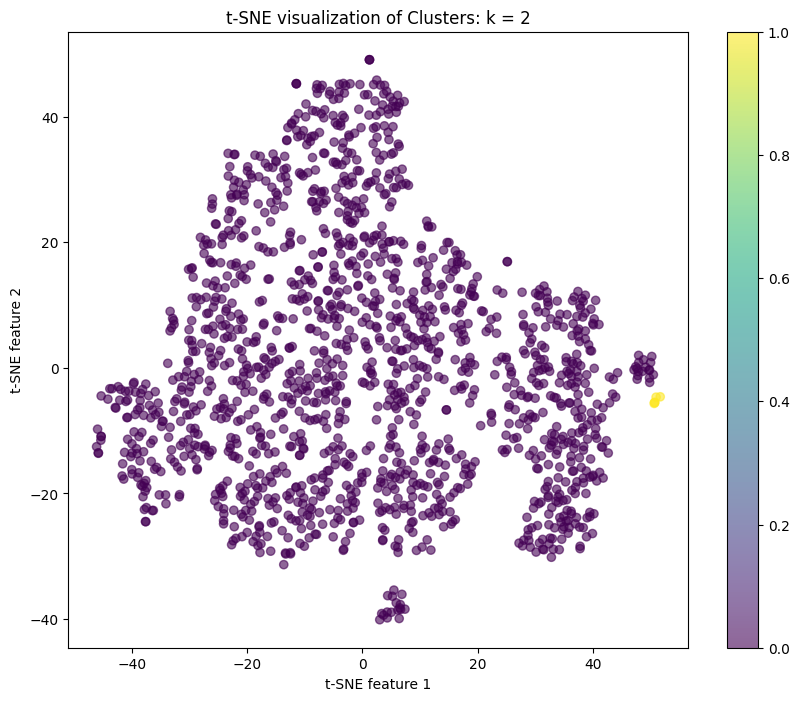

Saved all cluster mappings for k=2 to Cluster_results/agglomerative/k_2_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 3: 0.26
Cluster counts for k = 3:
+----------+-----+
|prediction|count|
+----------+-----+
|         0| 1158|
|         1|    5|
|         2|  374|
+----------+-----+



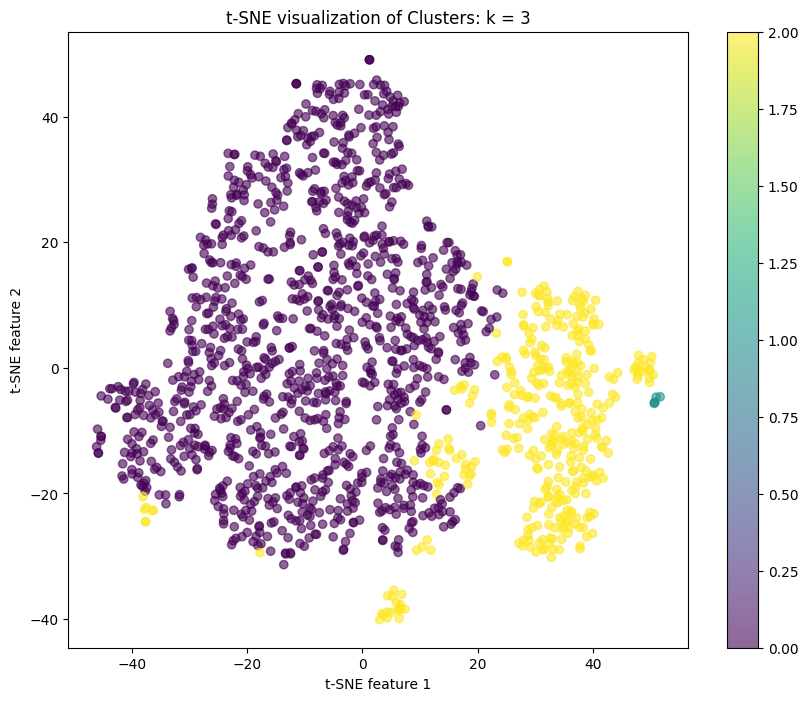

Saved all cluster mappings for k=3 to Cluster_results/agglomerative/k_3_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 4: 0.24
Cluster counts for k = 4:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  374|
|         1|    5|
|         3|  918|
|         2|  240|
+----------+-----+



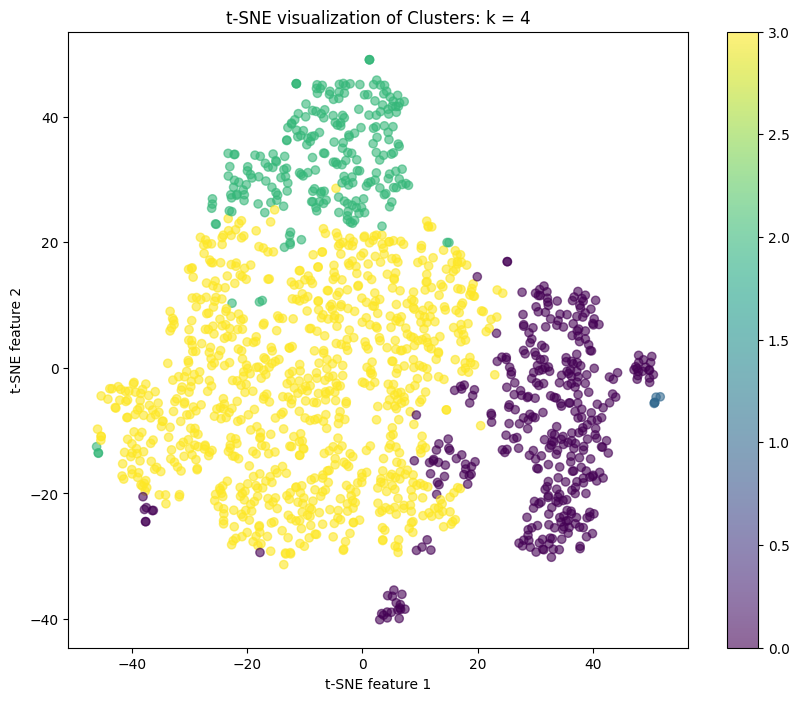

Saved all cluster mappings for k=4 to Cluster_results/agglomerative/k_4_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 5: 0.23
Cluster counts for k = 5:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|    5|
|         1|  356|
|         3|  918|
|         2|  240|
|         4|   18|
+----------+-----+



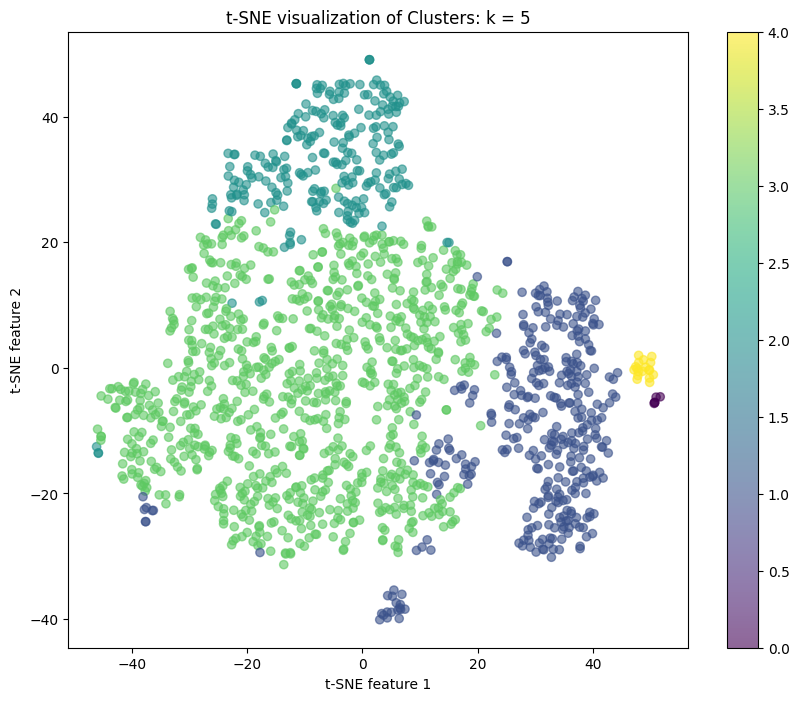

Saved all cluster mappings for k=5 to Cluster_results/agglomerative/k_5_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 6: 0.23
Cluster counts for k = 6:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  240|
|         5|    1|
|         1|  356|
|         3|  918|
|         2|    4|
|         4|   18|
+----------+-----+



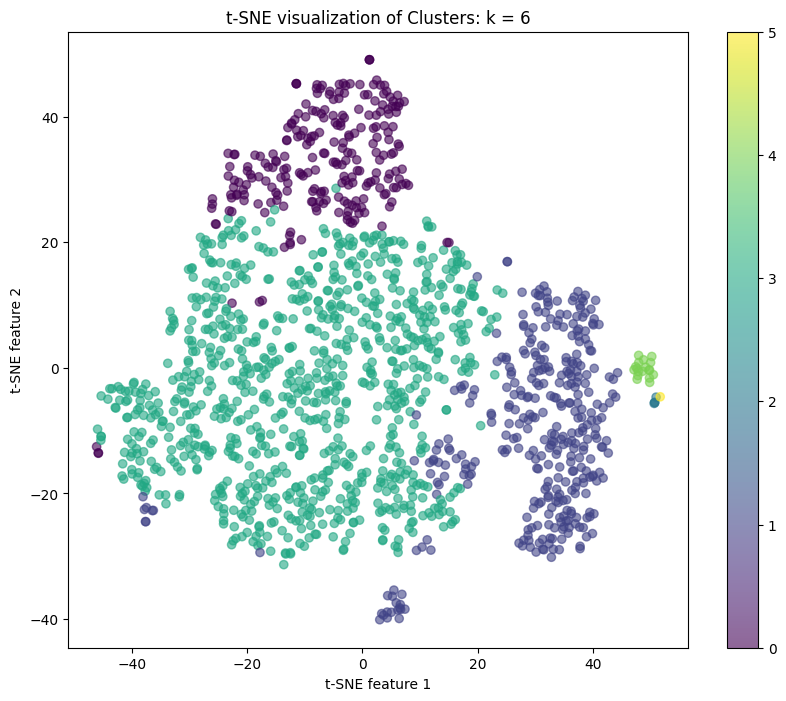

Saved all cluster mappings for k=6 to Cluster_results/agglomerative/k_6_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 7: 0.24
Cluster counts for k = 7:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  356|
|         6|    3|
|         5|    1|
|         1|  237|
|         3|  918|
|         2|    4|
|         4|   18|
+----------+-----+



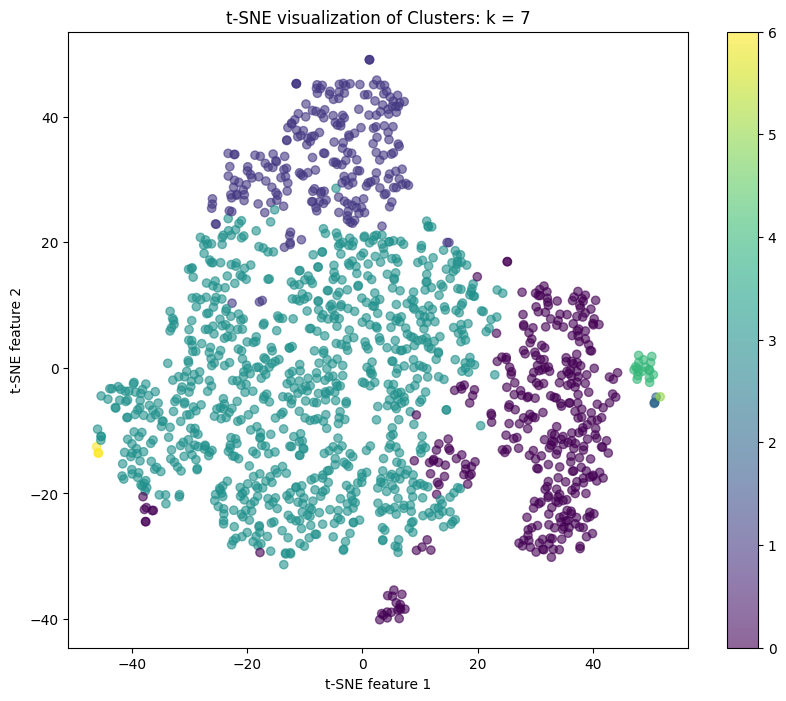

Saved all cluster mappings for k=7 to Cluster_results/agglomerative/k_7_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 8: 0.22
Cluster counts for k = 8:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  237|
|         7|  258|
|         6|    3|
|         5|    1|
|         1|  918|
|         3|   98|
|         2|    4|
|         4|   18|
+----------+-----+



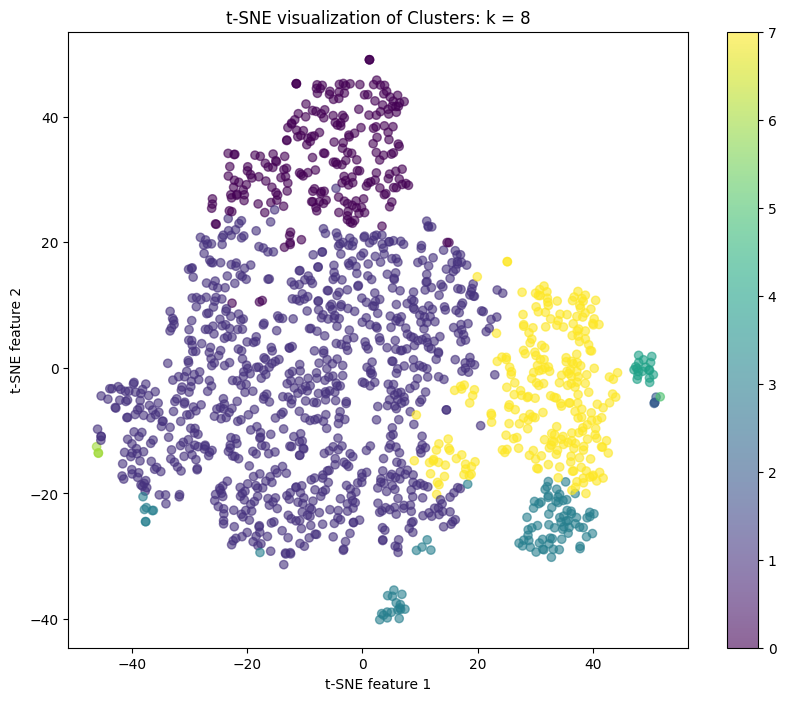

Saved all cluster mappings for k=8 to Cluster_results/agglomerative/k_8_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 9: 0.22
Cluster counts for k = 9:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  918|
|         7|  258|
|         6|    3|
|         5|    1|
|         1|   98|
|         3|  234|
|         8|    3|
|         2|    4|
|         4|   18|
+----------+-----+



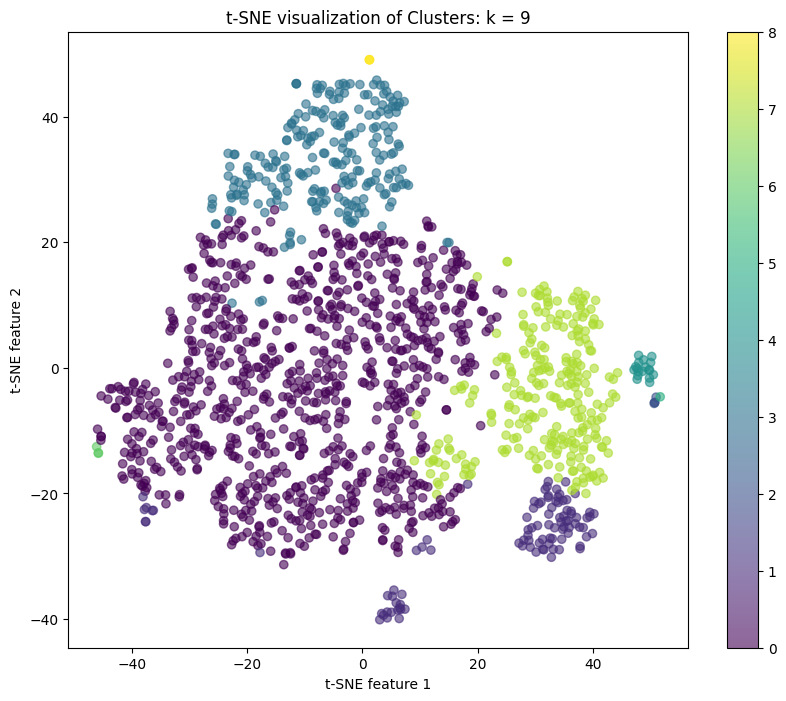

Saved all cluster mappings for k=9 to Cluster_results/agglomerative/k_9_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 10: 0.14
Cluster counts for k = 10:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  394|
|         7|  258|
|         6|    3|
|         9|  524|
|         5|    1|
|         1|   98|
|         3|  234|
|         8|    3|
|         2|    4|
|         4|   18|
+----------+-----+



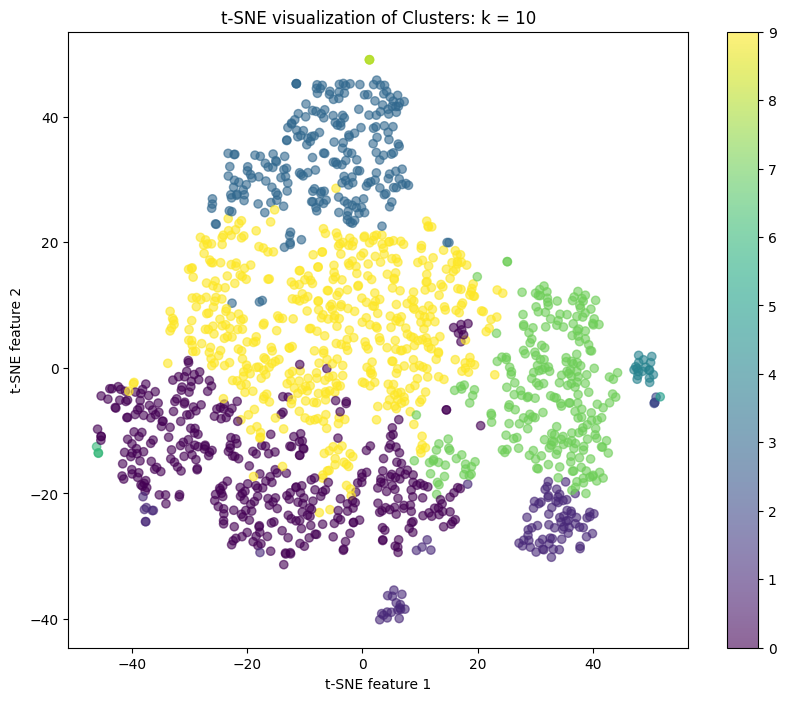

Saved all cluster mappings for k=10 to Cluster_results/agglomerative/k_10_clusters.pkl


In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Assign `row_id` once, right after scaling and before entering the loop
df_with_id_and_features = df_with_id_and_features.withColumn("ImageID", col("ImageID"))

# Function to perform clustering
def perform_clustering(dataframe, n_clusters):
    print("Performing clustering on", dataframe.count(), "rows")

    # Extract features without affecting the row_id
    features = np.array(dataframe.select("scaledFeatures").rdd.map(lambda row: row[0].toArray()).collect())

    # Clustering
    cluster_model = AgglomerativeClustering(n_clusters=n_clusters)
    labels = cluster_model.fit_predict(features)

    # Create DataFrame from labels, preserving the original row_id
    result_df = spark.createDataFrame(pd.DataFrame({
        'prediction': labels,
        'row_id': dataframe.select("row_id").rdd.flatMap(lambda x: x).collect()  # Collect and reuse original row_ids
    }))

    print("Clustered", result_df.count(), "rows")
    return features, labels, result_df


# List of cluster sizes to evaluate
k_list = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for k in k_list:
    # Perform clustering
    features, labels, predictions = perform_clustering(df_with_id_and_features, k)
    #print("predictions count",predictions.count())
    # Join using the consistent `row_id` that was assigned initially
    predictions_with_features = df_with_id_and_features.join(predictions, "row_id").drop("row_id")
    #print("predictions with feautures count",predictions_with_features.count())

    # Compute the silhouette score
    silhouette_avg = silhouette_score(features, labels)
    print(f"Silhouette Score for k = {k}: {silhouette_avg:.2f}")

    # Analysis: Count items per cluster
    cluster_counts = predictions_with_features.groupBy('prediction').count()
    print(f"Cluster counts for k = {k}:")
    cluster_counts.show()

    # Visualization for each k
    plot_clusters(predictions_with_features, f't-SNE visualization of Clusters: k = {k}')

    # Save cluster mappings to .pkl files
    save_cluster_mappings(predictions_with_features, k, "agglomerative")


## Spectral Clustering

Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 2: 0.29
Cluster counts for k = 2:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  360|
|         1| 1177|
+----------+-----+



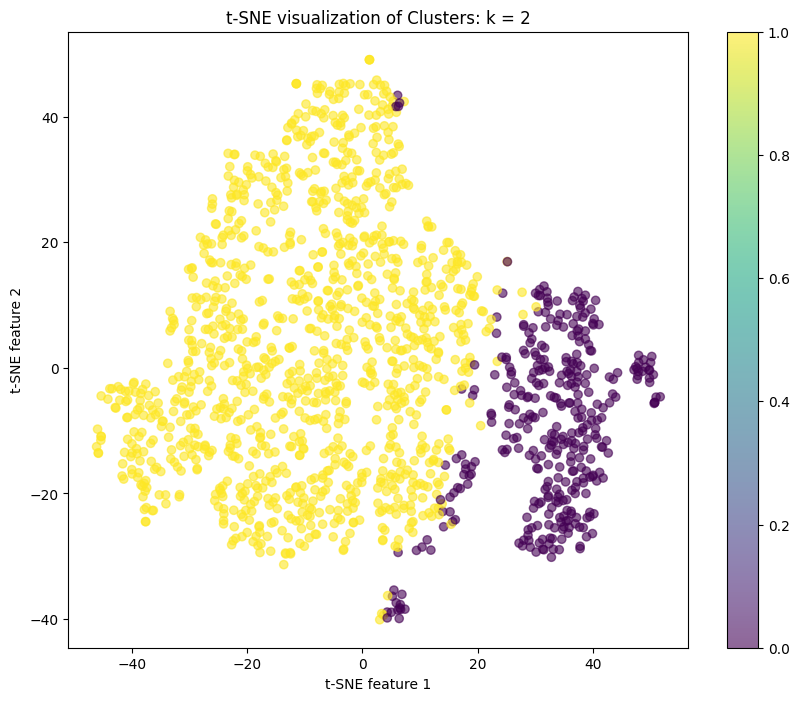

Saved all cluster mappings for k=2 to Cluster_results/spectral/k_2_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 3: 0.21
Cluster counts for k = 3:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  346|
|         1|  310|
|         2|  881|
+----------+-----+



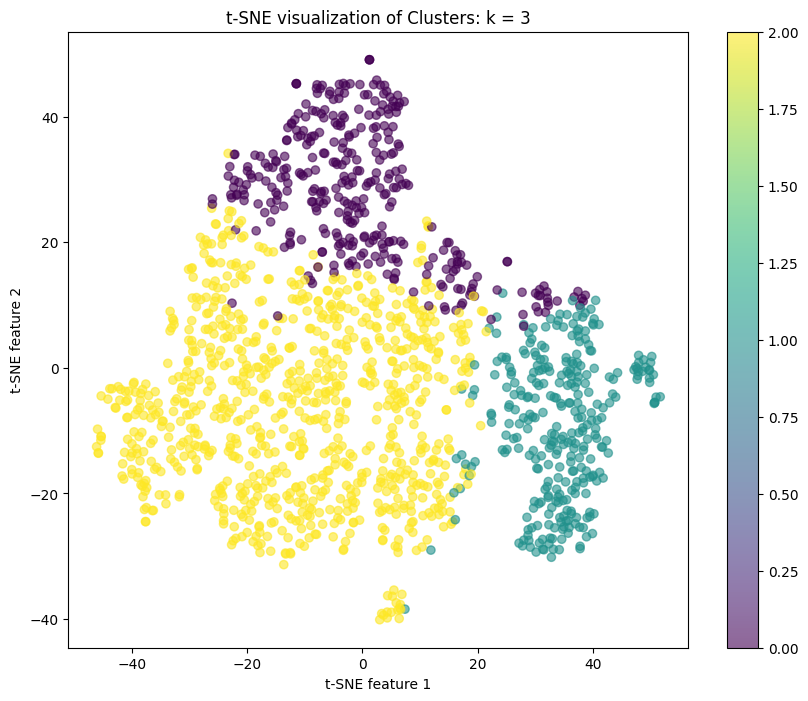

Saved all cluster mappings for k=3 to Cluster_results/spectral/k_3_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 4: 0.20
Cluster counts for k = 4:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  818|
|         1|  386|
|         3|  304|
|         2|   29|
+----------+-----+



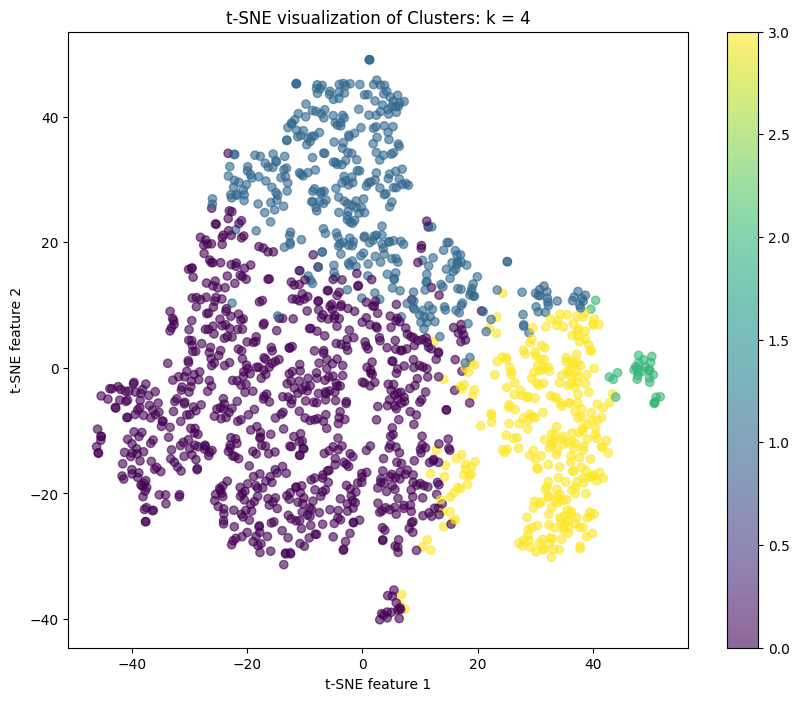

Saved all cluster mappings for k=4 to Cluster_results/spectral/k_4_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 5: 0.19
Cluster counts for k = 5:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  251|
|         1|  277|
|         3|   28|
|         2|  700|
|         4|  281|
+----------+-----+



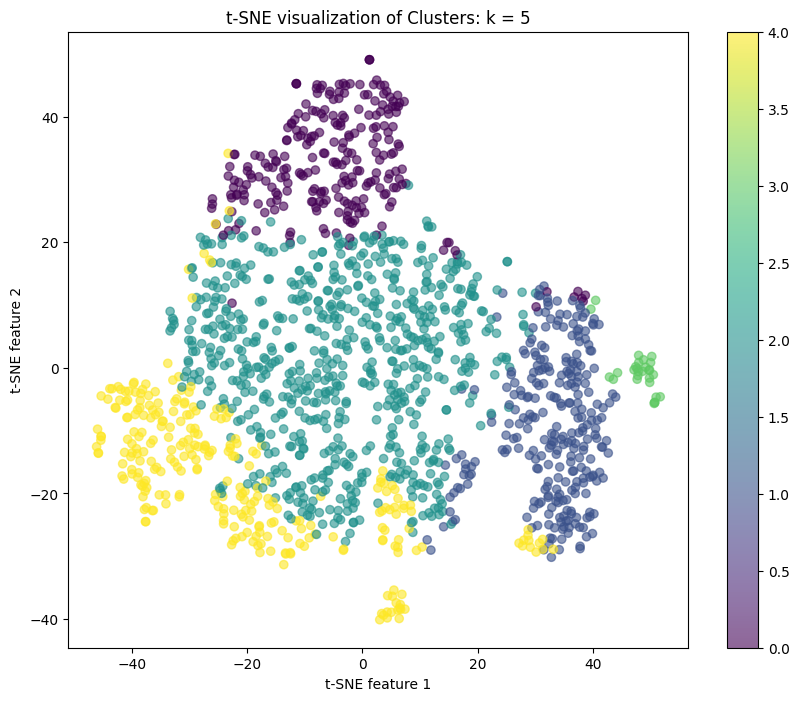

Saved all cluster mappings for k=5 to Cluster_results/spectral/k_5_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 6: 0.14
Cluster counts for k = 6:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  225|
|         5|  197|
|         1|   27|
|         3|  134|
|         2|  553|
|         4|  401|
+----------+-----+



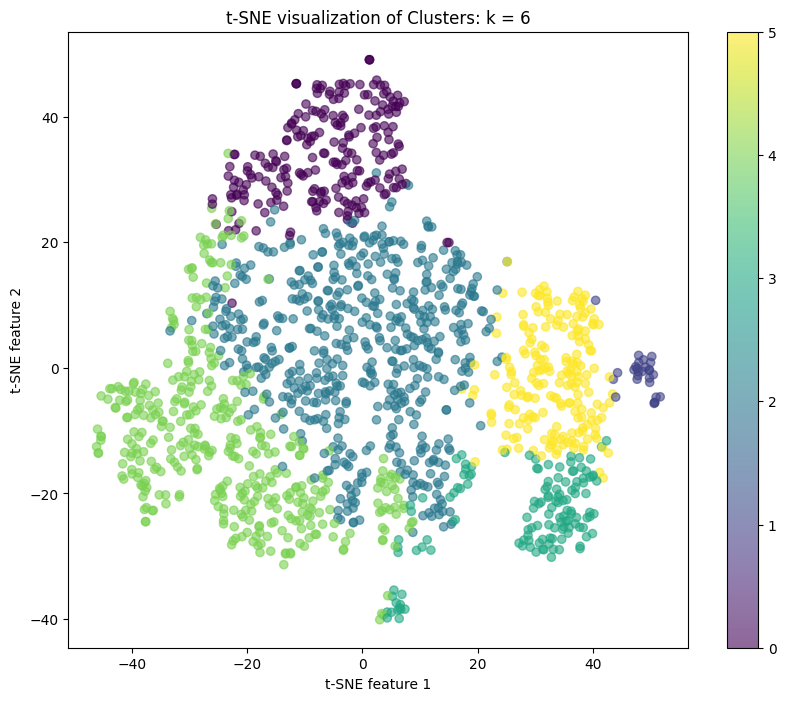

Saved all cluster mappings for k=6 to Cluster_results/spectral/k_6_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 7: 0.13
Cluster counts for k = 7:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  436|
|         6|  199|
|         5|  270|
|         1|  171|
|         3|   27|
|         2|  326|
|         4|  108|
+----------+-----+



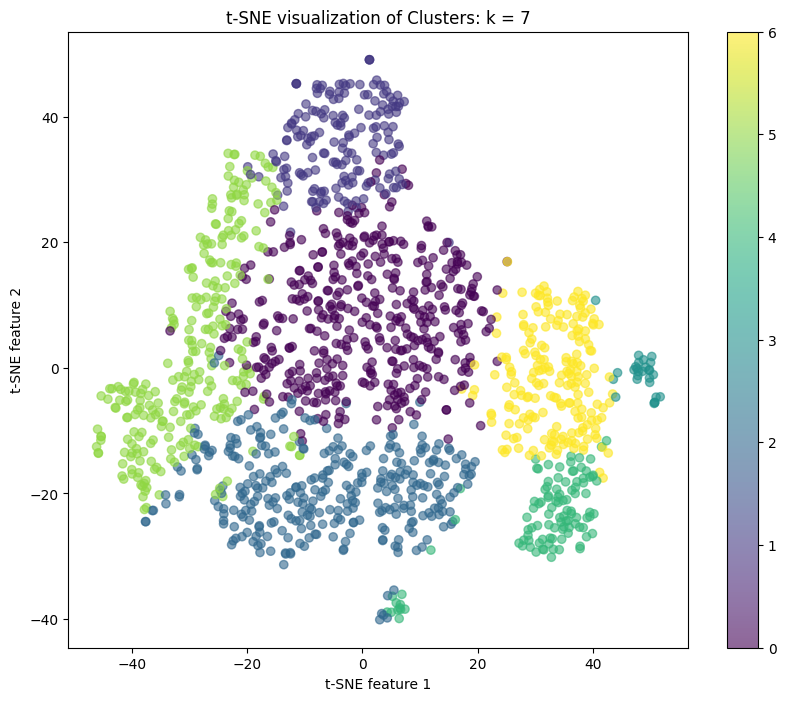

Saved all cluster mappings for k=7 to Cluster_results/spectral/k_7_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 8: 0.13
Cluster counts for k = 8:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  330|
|         7|  118|
|         6|  161|
|         5|   57|
|         1|  411|
|         3|   27|
|         2|  152|
|         4|  281|
+----------+-----+



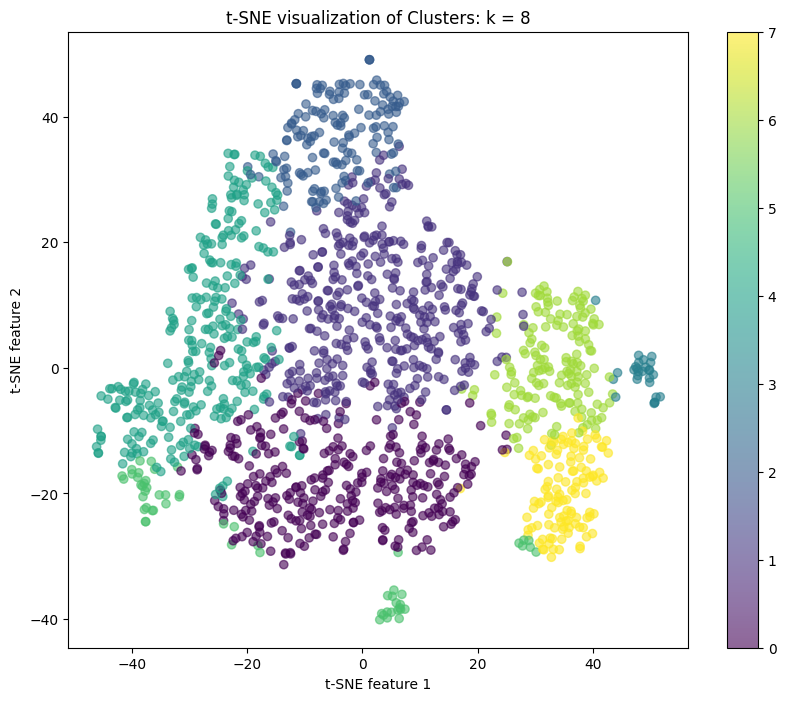

Saved all cluster mappings for k=8 to Cluster_results/spectral/k_8_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 9: 0.13
Cluster counts for k = 9:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   74|
|         7|  369|
|         6|   89|
|         5|  157|
|         1|  288|
|         3|   26|
|         8|   72|
|         2|  297|
|         4|  165|
+----------+-----+



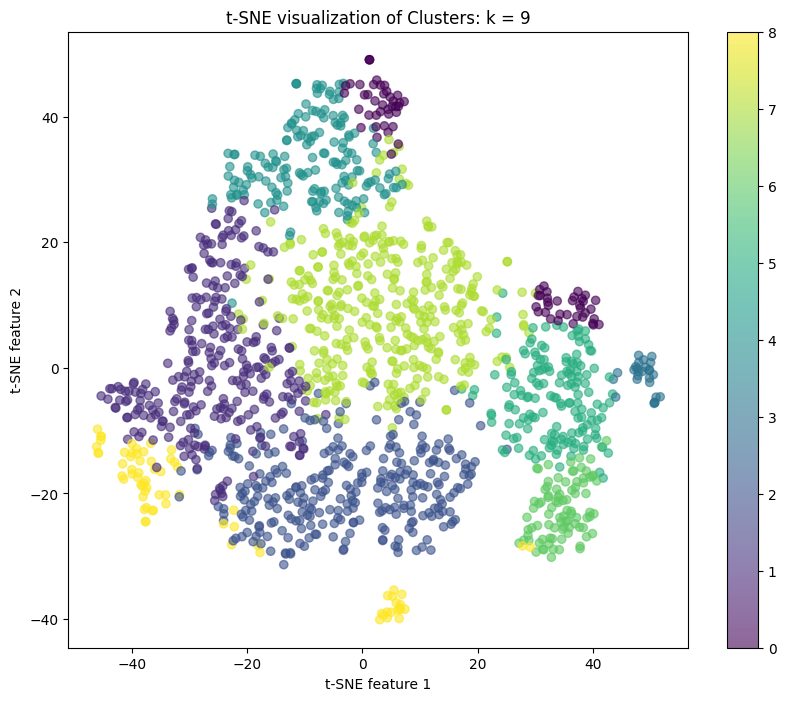

Saved all cluster mappings for k=9 to Cluster_results/spectral/k_9_clusters.pkl
Performing clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 10: 0.10
Cluster counts for k = 10:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  244|
|         7|  215|
|         6|   89|
|         9|   73|
|         5|  254|
|         1|  255|
|         3|   26|
|         8|   74|
|         2|  141|
|         4|  166|
+----------+-----+



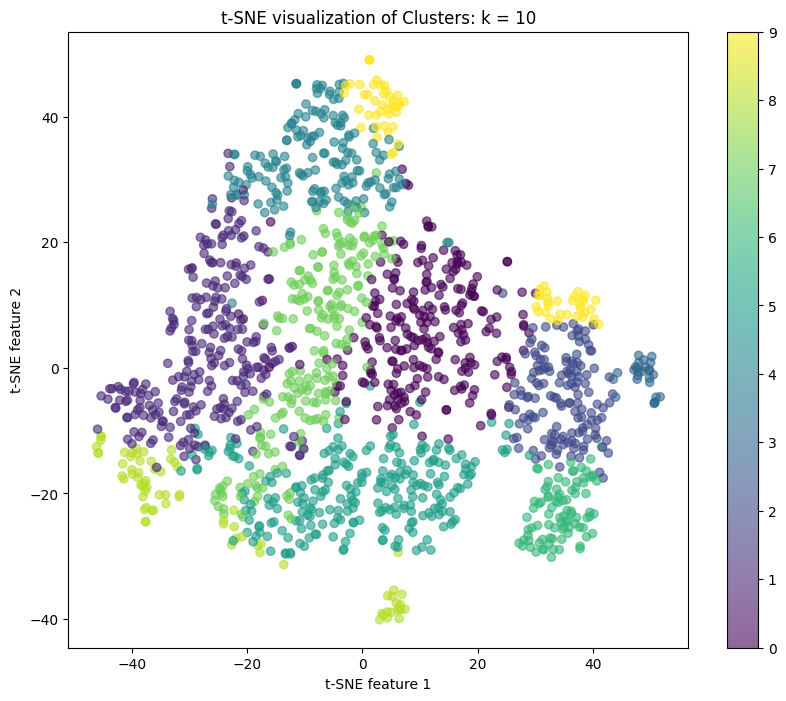

Saved all cluster mappings for k=10 to Cluster_results/spectral/k_10_clusters.pkl


In [ ]:
from sklearn.cluster import SpectralClustering

def perform_clustering(dataframe, n_clusters):
    print("Performing clustering on", dataframe.count(), "rows")
    features = np.array(dataframe.select("scaledFeatures").rdd.map(lambda row: row[0].toArray()).collect())
    cluster_model = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', assign_labels='discretize')
    labels = cluster_model.fit_predict(features)
    result_df = spark.createDataFrame(pd.DataFrame({
        'prediction': labels,
        'row_id': dataframe.select("row_id").rdd.flatMap(lambda x: x).collect()
    }))
    print("Clustered", result_df.count(), "rows")
    return features, labels, result_df

k_list = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for k in k_list:
    features, labels, predictions = perform_clustering(df_with_id_and_features, k)
    predictions_with_features = df_with_id_and_features.join(predictions, "row_id").drop("row_id")

    # Compute the silhouette score
    if len(np.unique(labels)) > 1:  # Silhouette score can only be computed with more than one cluster
        silhouette_avg = silhouette_score(features, labels)
        print(f"Silhouette Score for k = {k}: {silhouette_avg:.2f}")
    else:
        print(f"Silhouette Score for k = {k}: Cannot be computed with a single cluster.")

    # Perform analysis like counting items per cluster
    cluster_counts = predictions_with_features.groupBy('prediction').count()
    print(f"Cluster counts for k = {k}:")
    cluster_counts.show()

    # Visualization for each k (assuming plot_clusters function is defined)
    plot_clusters(predictions_with_features, f't-SNE visualization of Clusters: k = {k}')

    # Save cluster mappings to .pkl files
    save_cluster_mappings(predictions_with_features, k, "spectral")

## GMM

Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 2: 0.82
Cluster counts for k = 2:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   13|
|         1| 1524|
+----------+-----+



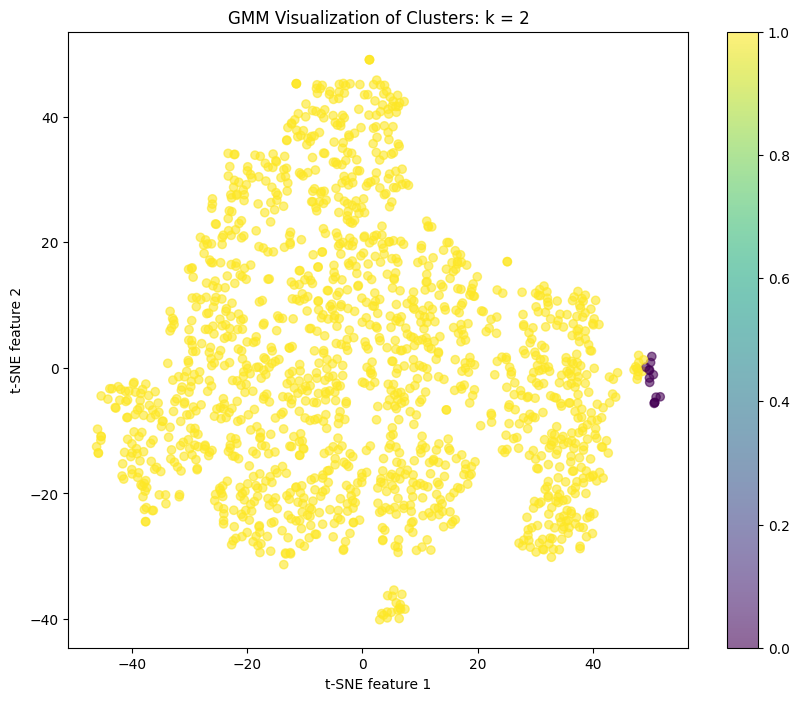

Saved all cluster mappings for k=2 to Cluster_results/gmm_k/k_2_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 3: 0.17
Cluster counts for k = 3:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   13|
|         1|  690|
|         2|  834|
+----------+-----+



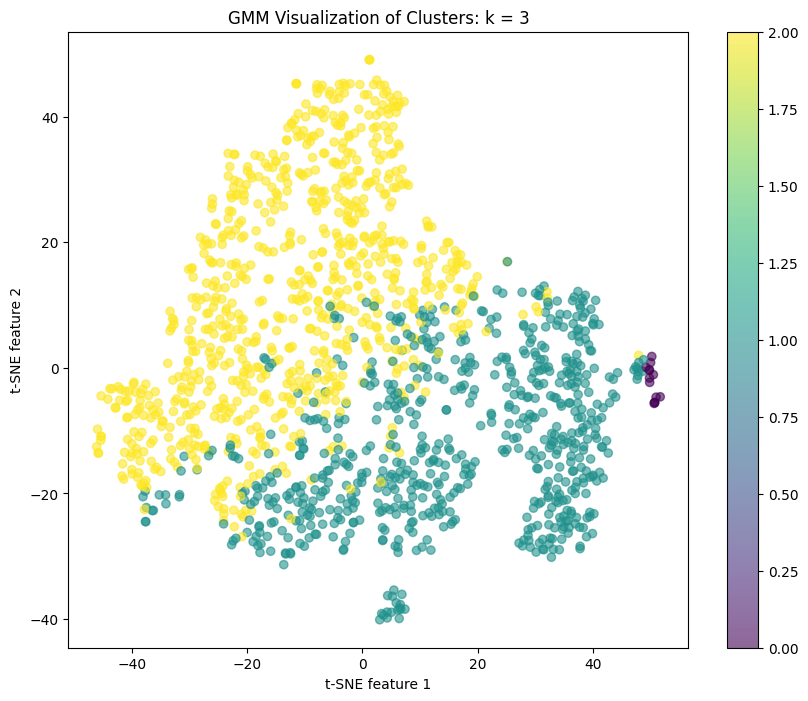

Saved all cluster mappings for k=3 to Cluster_results/gmm_k/k_3_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 4: 0.25
Cluster counts for k = 4:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|    5|
|         1|  313|
|         3|  964|
|         2|  255|
+----------+-----+



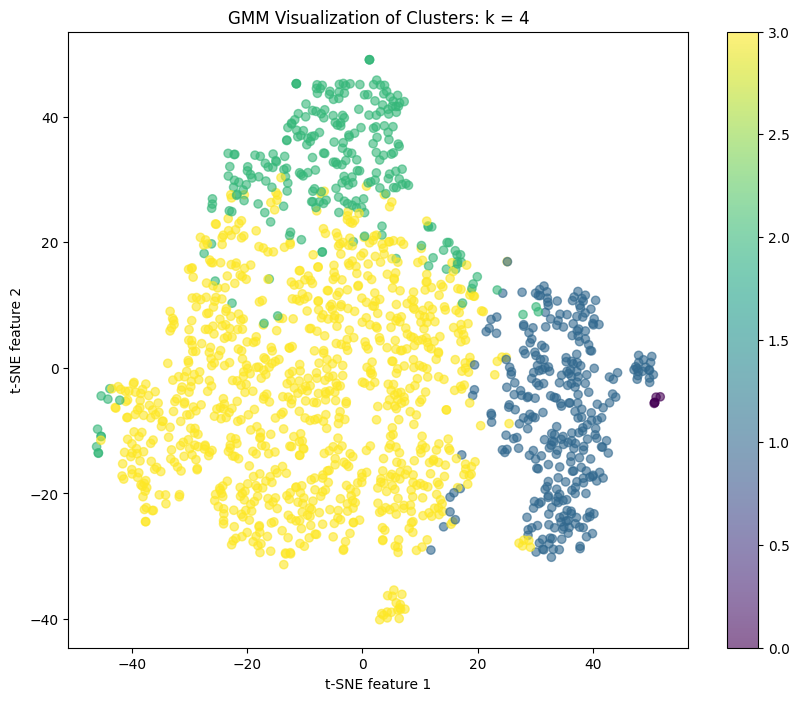

Saved all cluster mappings for k=4 to Cluster_results/gmm_k/k_4_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 5: 0.23
Cluster counts for k = 5:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   19|
|         1|  359|
|         3|  909|
|         2|  249|
|         4|    1|
+----------+-----+



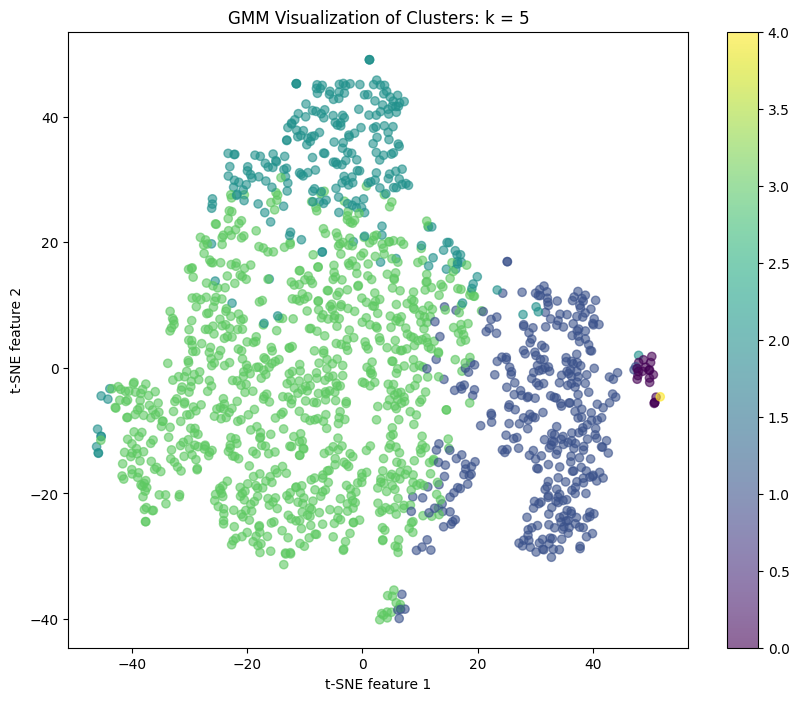

Saved all cluster mappings for k=5 to Cluster_results/gmm_k/k_5_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 6: 0.23
Cluster counts for k = 6:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   19|
|         5|  327|
|         1|  821|
|         3|  145|
|         2|  224|
|         4|    1|
+----------+-----+



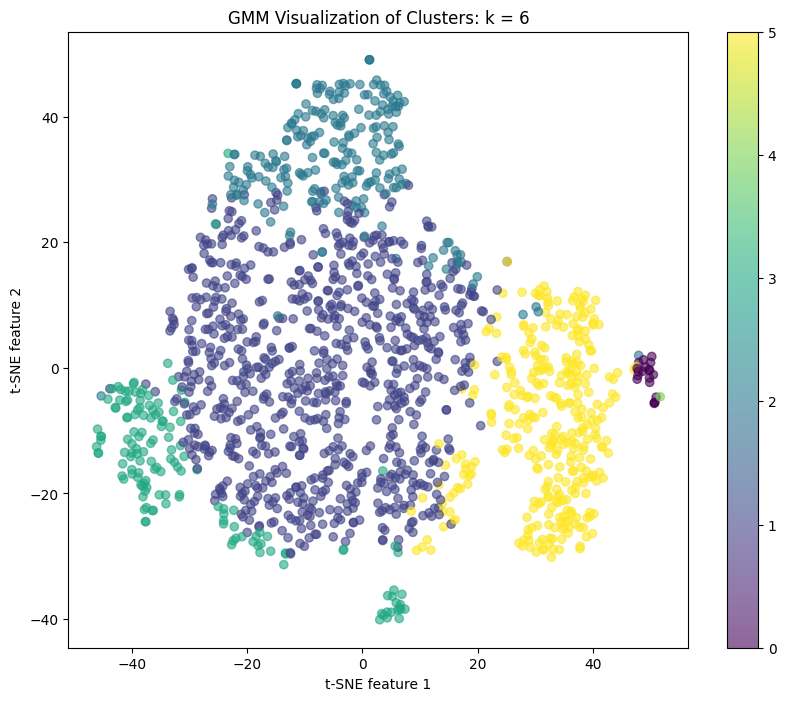

Saved all cluster mappings for k=6 to Cluster_results/gmm_k/k_6_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 7: 0.18
Cluster counts for k = 7:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   19|
|         6|   45|
|         5|  315|
|         1|  690|
|         3|   91|
|         2|  376|
|         4|    1|
+----------+-----+



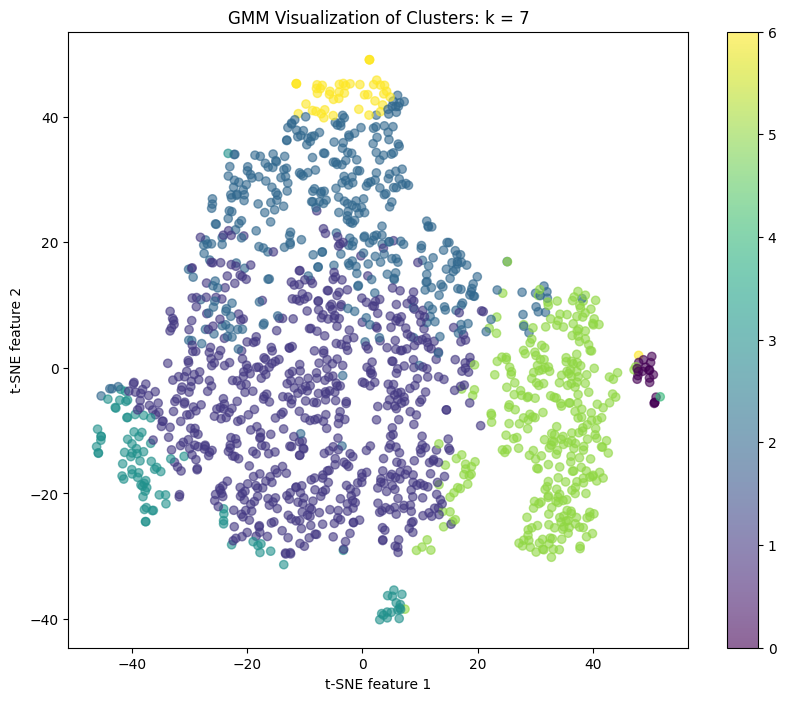

Saved all cluster mappings for k=7 to Cluster_results/gmm_k/k_7_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 8: 0.17
Cluster counts for k = 8:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   18|
|         7|   78|
|         6|  294|
|         5|    4|
|         1|  595|
|         3|    1|
|         2|   98|
|         4|  449|
+----------+-----+



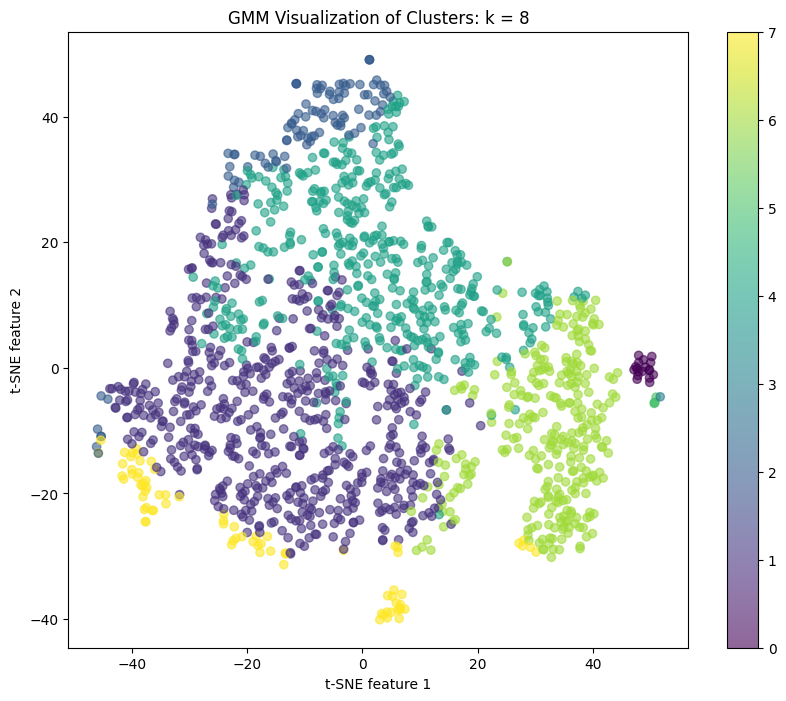

Saved all cluster mappings for k=8 to Cluster_results/gmm_k/k_8_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 9: 0.17
Cluster counts for k = 9:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   18|
|         7|   88|
|         6|  293|
|         5|    4|
|         1|  587|
|         3|    1|
|         8|    3|
|         2|  104|
|         4|  439|
+----------+-----+



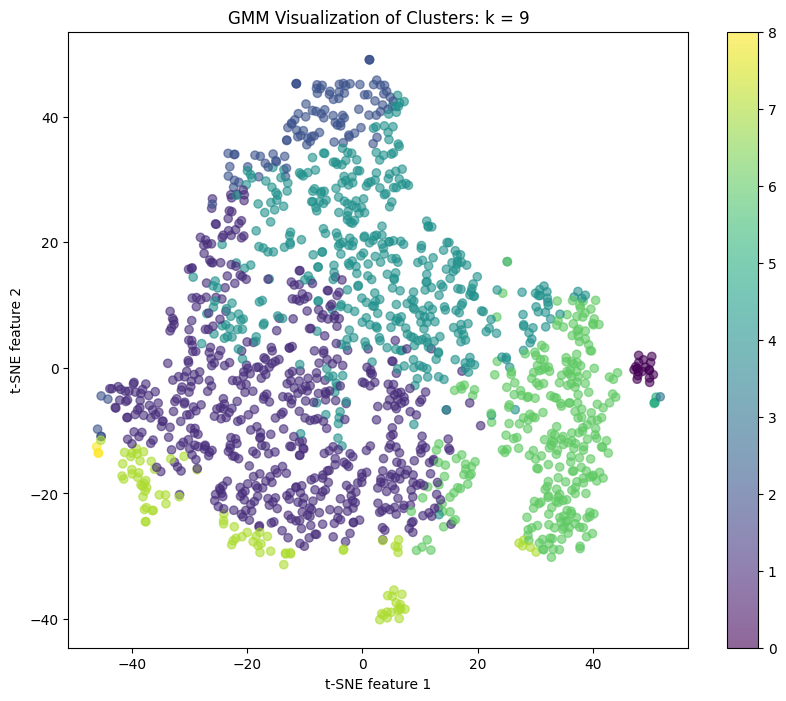

Saved all cluster mappings for k=9 to Cluster_results/gmm_k/k_9_clusters.pkl
Performing GMM clustering on 1537 rows
Clustered 1537 rows
Silhouette Score for k = 10: 0.17
Cluster counts for k = 10:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   18|
|         7|   88|
|         6|  282|
|         9|    3|
|         5|    4|
|         1|  565|
|         3|    1|
|         8|    3|
|         2|  142|
|         4|  431|
+----------+-----+



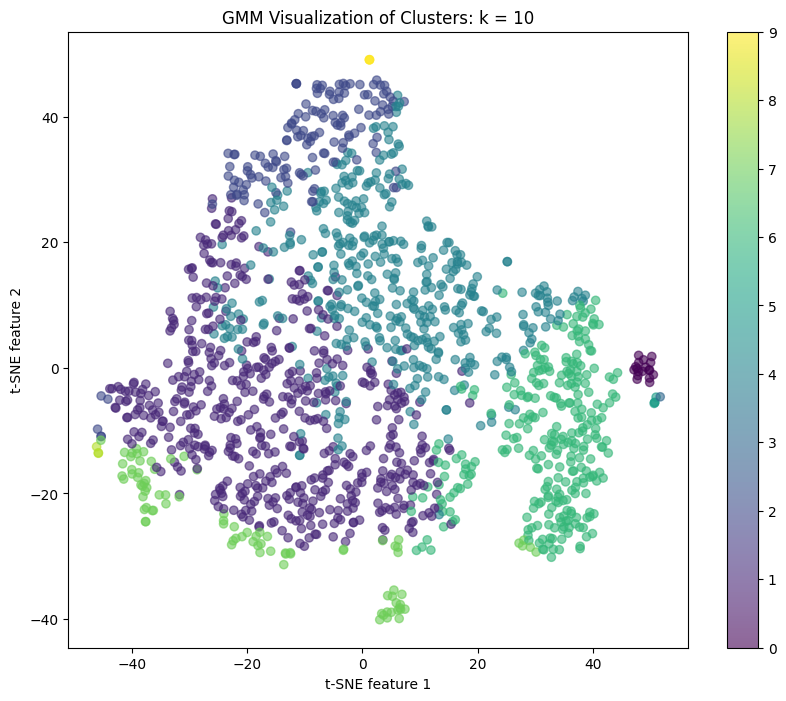

Saved all cluster mappings for k=10 to Cluster_results/gmm_k/k_10_clusters.pkl


In [ ]:
from sklearn.mixture import GaussianMixture

def perform_gmm_clustering(dataframe, n_clusters):
    print("Performing GMM clustering on", dataframe.count(), "rows")
    features = np.array(dataframe.select("scaledFeatures").rdd.map(lambda row: row[0].toArray()).collect())
    gmm = GaussianMixture(n_components=n_clusters, random_state=0)
    gmm.fit(features)
    labels = gmm.predict(features)
    result_df = spark.createDataFrame(pd.DataFrame({
        'prediction': labels,
        'row_id': dataframe.select("row_id").rdd.flatMap(lambda x: x).collect()
    }))
    print("Clustered", result_df.count(), "rows")
    return features, labels, result_df

# Usage example
for k in k_list:
    features, labels, predictions = perform_gmm_clustering(df_with_id_and_features, k)
    predictions_with_features = df_with_id_and_features.join(predictions, "row_id").drop("row_id")
    if len(np.unique(labels)) > 1:
        silhouette_avg = silhouette_score(features, labels)
        print(f"Silhouette Score for k = {k}: {silhouette_avg:.2f}")
    else:
        print(f"Silhouette Score for k = {k}: Cannot be computed with a single cluster.")
    cluster_counts = predictions_with_features.groupBy('prediction').count()
    print(f"Cluster counts for k = {k}:")
    cluster_counts.show()
    plot_clusters(predictions_with_features, f'GMM Visualization of Clusters: k = {k}')

    # Save cluster mappings to .pkl files
    save_cluster_mappings(predictions_with_features, k, "gmm")


In [ ]:
from sklearn.decomposition import PCA

def perform_gmm_clustering(dataframe, n_clusters, covariance_type='full'):
    print("Performing GMM clustering on", dataframe.count(), "rows with", covariance_type, "covariance.")
    features = np.array(dataframe.select("scaledFeatures").rdd.map(lambda row: row[0].toArray()).collect())

    gmm = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, random_state=0)
    gmm.fit(features)
    labels = gmm.predict(features)

    # Calculating metrics
    aic = gmm.aic(features)
    bic = gmm.bic(features)
    silhouette_avg = silhouette_score(features, labels) if len(np.unique(labels)) > 1 else "N/A"

    result_df = spark.createDataFrame(pd.DataFrame({
        'prediction': labels,
        'row_id': dataframe.select("row_id").rdd.flatMap(lambda x: x).collect()
    }))

    print(f"Clustered {result_df.count()} rows, AIC: {aic}, BIC: {bic}, Silhouette: {silhouette_avg}")
    return features, labels, result_df, aic, bic, silhouette_avg

k_list = [2, 3, 4, 5, 6, 7, 8, 9, 10]
covariance_types = ['full', 'tied', 'diag', 'spherical']

for k in k_list:
    for covariance_type in covariance_types:
        features, labels, predictions, aic, bic, silhouette_avg = perform_gmm_clustering(df_with_id_and_features, k, covariance_type)
        predictions_with_features = df_with_id_and_features.join(predictions, "row_id").drop("row_id")

        # Plotting
        #pca = PCA(n_components=2)
        #pca_result = pca.fit_transform(features)
        #plt.figure(figsize=(10, 8))
        #plt.scatter(pca_result[:, 0], pca_result[:, 1], c=labels, cmap='viridis', alpha=0.5)
        #plt.colorbar()
        #plt.title(f'PCA of GMM Clusters for k = {k}, Covariance Type: {covariance_type}')
        #plt.xlabel('Principal Component 1')
        #plt.ylabel('Principal Component 2')
        #plt.show()

        # Perform analysis like counting items per cluster
        cluster_counts = predictions_with_features.groupBy('prediction').count()
        print(f"Cluster counts for k = {k} with {covariance_type} covariance:")
        cluster_counts.show()

Performing GMM clustering on 1537 rows with full covariance.
Clustered 1537 rows, AIC: -455640.30017036234, BIC: -388093.1272758814, Silhouette: 0.8234507250938825
Cluster counts for k = 2 with full covariance:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   13|
|         1| 1524|
+----------+-----+

Performing GMM clustering on 1537 rows with tied covariance.
Clustered 1537 rows, AIC: -345731.58354899916, BIC: -311362.85606835416, Silhouette: 0.8234507250938825
Cluster counts for k = 2 with tied covariance:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|   13|
|         1| 1524|
+----------+-----+

Performing GMM clustering on 1537 rows with diag covariance.
Clustered 1537 rows, AIC: -33361.67661303515, BIC: -30986.450067160476, Silhouette: 0.3273785082576811
Cluster counts for k = 2 with diag covariance:
+----------+-----+
|prediction|count|
+----------+-----+
|         0|  273|
|         1| 1264|
+----------+-----+

Performing GMM cluste

## Storing Clusters in a file

In [ ]:
!zip -r /content/Cluster_results.zip /content/Cluster_results

  adding: content/Cluster_results/ (stored 0%)
  adding: content/Cluster_results/agglomerative/ (stored 0%)
  adding: content/Cluster_results/agglomerative/k_4_clusters.pkl (deflated 72%)
  adding: content/Cluster_results/agglomerative/k_10_clusters.pkl (deflated 71%)
  adding: content/Cluster_results/agglomerative/k_5_clusters.pkl (deflated 72%)
  adding: content/Cluster_results/agglomerative/k_8_clusters.pkl (deflated 71%)
  adding: content/Cluster_results/agglomerative/k_2_clusters.pkl (deflated 72%)
  adding: content/Cluster_results/agglomerative/k_9_clusters.pkl (deflated 71%)
  adding: content/Cluster_results/agglomerative/k_3_clusters.pkl (deflated 71%)
  adding: content/Cluster_results/agglomerative/k_7_clusters.pkl (deflated 71%)
  adding: content/Cluster_results/agglomerative/k_6_clusters.pkl (deflated 71%)
  adding: content/Cluster_results/gmm/ (stored 0%)
  adding: content/Cluster_results/gmm/k_4_clusters.pkl (deflated 72%)
  adding: content/Cluster_results/gmm/k_10_cluster

In [ ]:
!unzip /content/Clusters.zip

Archive:  /content/Clusters.zip
   creating: Cluster_results/agglomerative/
  inflating: Cluster_results/agglomerative/k_10_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_2_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_3_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_4_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_5_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_6_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_7_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_8_clusters.pkl  
  inflating: Cluster_results/agglomerative/k_9_clusters.pkl  
   creating: Cluster_results/gmm/
  inflating: Cluster_results/gmm/k_10_clusters.pkl  
  inflating: Cluster_results/gmm/k_2_clusters.pkl  
  inflating: Cluster_results/gmm/k_3_clusters.pkl  
  inflating: Cluster_results/gmm/k_4_clusters.pkl  
  inflating: Cluster_results/gmm/k_5_clusters.pkl  
  inflating: Cluster_results/gmm/k_6_clusters.pkl  
  inflating: Clust

In [ ]:
import pickle

file_name = '/content/cluster_dict.pkl'

# Open the pickle file
with open(file_name, 'rb') as f:
    all_cluster = pickle.load(f)

# Print the content of the loaded dictionary
print(all_cluster)

{0: ['BraTS-GoAT-01244.pkl', 'BraTS-GoAT-02230.pkl', 'BraTS-GoAT-00305.pkl', 'BraTS-GoAT-01776.pkl', 'BraTS-GoAT-00398.pkl', 'BraTS-GoAT-00752.pkl', 'BraTS-GoAT-01213.pkl', 'BraTS-GoAT-01074.pkl', 'BraTS-GoAT-00146.pkl', 'BraTS-GoAT-01154.pkl', 'BraTS-GoAT-02067.pkl', 'BraTS-GoAT-01148.pkl', 'BraTS-GoAT-01094.pkl', 'BraTS-GoAT-00758.pkl', 'BraTS-GoAT-01650.pkl', 'BraTS-GoAT-00757.pkl', 'BraTS-GoAT-00397.pkl', 'BraTS-GoAT-01099.pkl', 'BraTS-GoAT-01845.pkl', 'BraTS-GoAT-00336.pkl', 'BraTS-GoAT-00034.pkl', 'BraTS-GoAT-01798.pkl', 'BraTS-GoAT-01335.pkl', 'BraTS-GoAT-00904.pkl', 'BraTS-GoAT-01940.pkl', 'BraTS-GoAT-01166.pkl', 'BraTS-GoAT-01501.pkl', 'BraTS-GoAT-01663.pkl', 'BraTS-GoAT-00293.pkl', 'BraTS-GoAT-00290.pkl', 'BraTS-GoAT-01715.pkl', 'BraTS-GoAT-02032.pkl', 'BraTS-GoAT-00499.pkl', 'BraTS-GoAT-00215.pkl', 'BraTS-GoAT-01936.pkl', 'BraTS-GoAT-00136.pkl', 'BraTS-GoAT-00262.pkl', 'BraTS-GoAT-01853.pkl', 'BraTS-GoAT-01895.pkl', 'BraTS-GoAT-00620.pkl', 'BraTS-GoAT-00411.pkl', 'BraTS-GoAT

In [ ]:
all_cluster_list = list()
for key in all_cluster:
  for val in all_cluster[key]:
    all_cluster_list.append(val)
print(len(all_cluster_list))

2251


In [ ]:
file_name = '/content/Cluster_results/agglomerative/k_10_clusters.pkl'

# Open the pickle file
with open(file_name, 'rb') as f:
    cluster_file = pickle.load(f)

# Print the content of the loaded dictionary
print(cluster_file)

{2: [1181.0, 2249.0, 418.0, 1999.0], 0: [1117.0, 489.0, 413.0, 2001.0, 1420.0, 2089.0, 2145.0, 268.0, 1314.0, 2177.0, 694.0, 132.0, 1848.0, 641.0, 188.0, 953.0, 520.0, 20.0, 1267.0, 613.0, 263.0, 624.0, 1081.0, 621.0, 2197.0, 1493.0, 1142.0, 1796.0, 1944.0, 1536.0, 857.0, 144.0, 1632.0, 1637.0, 1170.0, 122.0, 2176.0, 1865.0, 10.0, 730.0, 2199.0, 1744.0, 72.0, 381.0, 722.0, 1030.0, 365.0, 2042.0, 341.0, 75.0, 1275.0, 1378.0, 321.0, 1477.0, 2169.0, 1059.0, 582.0, 1837.0, 920.0, 2016.0, 2160.0, 600.0, 2026.0, 585.0, 167.0, 123.0, 2150.0, 1254.0, 858.0, 2007.0, 1525.0, 517.0, 48.0, 535.0, 306.0, 1889.0, 1984.0, 2114.0, 348.0, 1716.0, 712.0, 1337.0, 610.0, 120.0, 1196.0, 1250.0, 2118.0, 709.0, 767.0, 1647.0, 1756.0, 1997.0, 777.0, 631.0, 1298.0, 193.0, 1338.0, 292.0, 854.0, 2009.0, 2174.0, 1494.0, 986.0, 496.0, 11.0, 1745.0, 1868.0, 1278.0, 779.0, 1578.0, 2110.0, 115.0, 632.0, 1086.0, 1659.0, 1300.0, 2055.0, 2094.0, 473.0, 285.0, 1989.0, 745.0, 17.0, 2200.0, 2069.0, 566.0, 383.0, 1185.0, 22

In [ ]:
def add_inclusterable_images(cluster,k,all_cluster_list):
  if cluster == 'kmeans':
    file_name = f'/content/Cluster_results/{cluster}/k_{k}.pkl'
  else:
    file_name = f'/content/Cluster_results/{cluster}/k_{k}_clusters.pkl'

  # Open the pickle file
  with open(file_name, 'rb') as f:
      cluster_file = pickle.load(f)
  file_prefix = "BraTS-GoAT-"
  new_cluster_file = dict()
  images = list()
  for key in cluster_file:
    for val in cluster_file[key]:
      new_val = str(int(val))
      new_val = (5-len(new_val))*'0' + new_val
      images.append(f'{file_prefix}{new_val}.pkl')
      if key not in new_cluster_file:
        new_cluster_file[key] = [f'{file_prefix}{new_val}.pkl']
      else:
        new_cluster_file[key].append(f'{file_prefix}{new_val}.pkl')

  #print(len(new_cluster_file))
  #print(len(images))
  new_key=len(new_cluster_file)
  new_cluster_file[new_key] = []
  for image in all_cluster_list:
    if image not in images:
      new_cluster_file[new_key].append(image)
  #print(len(new_cluster_file))
  #print(len(images)+len(new_cluster_file[new_key]))
  return new_cluster_file


In [ ]:
for cluster in ['spectral','agglomerative','gmm','kmeans']:
  dir_path = f'Cluster_results_n2/{cluster}'

  # Create the directory if it doesn't exist
  os.makedirs(dir_path, exist_ok=True)
  for k in [2,3,4,5,6,7,8,9,10]:
    print(cluster,k)
    new_cluster_file = add_inclusterable_images(cluster,k,all_cluster_list)
    print(len(new_cluster_file))
    file_name = f'/content/Cluster_results_n2/{cluster}/k_{k}_clusters.pkl'
    with open(file_name, 'wb') as f:
      pickle.dump(new_cluster_file, f)

spectral 2
3
spectral 3
4
spectral 4
5
spectral 5
6
spectral 6
7
spectral 7
8
spectral 8
9
spectral 9
10
spectral 10
11
agglomerative 2
3
agglomerative 3
4
agglomerative 4
5
agglomerative 5
6
agglomerative 6
7
agglomerative 7
8
agglomerative 8
9
agglomerative 9
10
agglomerative 10
11
gmm 2
3
gmm 3
4
gmm 4
5
gmm 5
6
gmm 6
7
gmm 7
8
gmm 8
9
gmm 9
10
gmm 10
11
kmeans 2
3
kmeans 3
4
kmeans 4
5
kmeans 5
6
kmeans 6
7
kmeans 7
8
kmeans 8
9
kmeans 9
10
kmeans 10
11


In [ ]:
for cluster in ['spectral','agglomerative','gmm','kmeans']:
  for k in [2,3,4,5,6,7,8,9,10]:
    file_name = f'/content/Cluster_results_n2/{cluster}/k_{k}_clusters.pkl'
    with open(file_name, 'rb') as f:
      cluster_file = pickle.load(f)
    print(len(cluster_file))
    total=0
    for key in cluster_file:
      total+=len(cluster_file[key])
    print(total)

3
2251
4
2251
5
2251
6
2251
7
2251
8
2251
9
2251
10
2251
11
2251
3
2251
4
2251
5
2251
6
2251
7
2251
8
2251
9
2251
10
2251
11
2251
3
2251
4
2251
5
2251
6
2251
7
2251
8
2251
9
2251
10
2251
11
2251
3
2251
4
2251
5
2251
6
2251
7
2251
8
2251
9
2251
10
2251
11
2251


In [ ]:
!zip -r /content/Cluster_results_n2.zip /content/Cluster_results_n2

  adding: content/Cluster_results_n2/ (stored 0%)
  adding: content/Cluster_results_n2/agglomerative/ (stored 0%)
  adding: content/Cluster_results_n2/agglomerative/k_4_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_10_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_5_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_8_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_2_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_9_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_3_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_7_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/agglomerative/k_6_clusters.pkl (deflated 94%)
  adding: content/Cluster_results_n2/kmeans/ (stored 0%)
  adding: content/Cluster_results_n2/kmeans/k_4_clusters.pkl (deflated 94%)
  add

## Mean Shift Clustering

Performing Mean Shift clustering on 1537 rows
Clustered 1537 rows
Silhouette Score: 0.42
Cluster counts:
+----------+-----+
|prediction|count|
+----------+-----+
|        19|    2|
|         0| 1473|
|         7|    1|
|         6|    5|
|        27|    1|
|        17|    1|
|         5|    8|
|         1|   10|
|         8|    1|
|         2|    4|
|         4|    2|
|        13|    1|
|        18|    5|
|        15|    1|
|        23|    4|
|        24|    1|
|        26|    3|
|        22|    1|
|        25|    1|
|         9|    1|
+----------+-----+
only showing top 20 rows



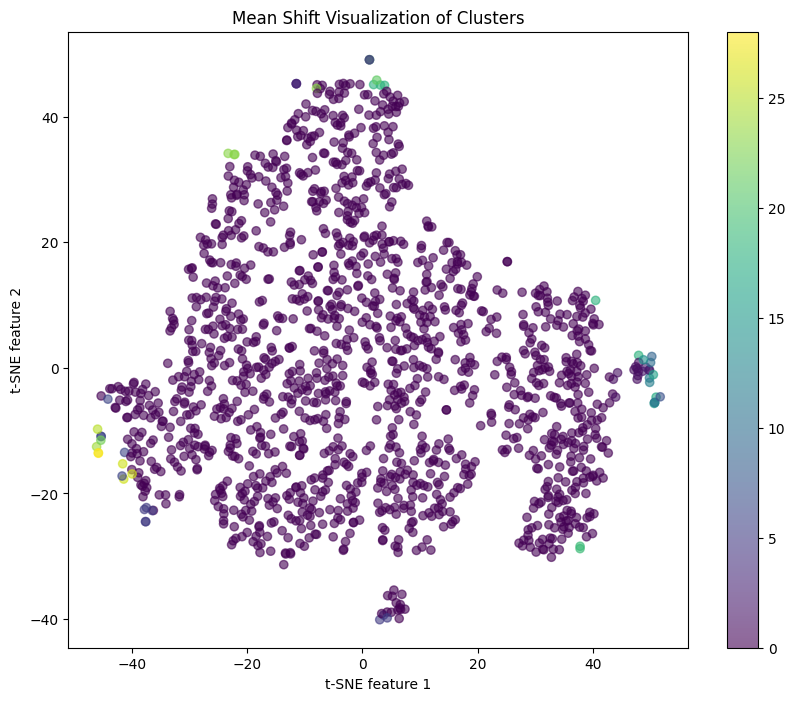

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.metrics import silhouette_score
def perform_mean_shift_clustering(dataframe):
    print("Performing Mean Shift clustering on", dataframe.count(), "rows")
    features = np.array(dataframe.select("scaledFeatures").rdd.map(lambda row: row[0].toArray()).collect())
    bandwidth = estimate_bandwidth(features, quantile=0.5, n_samples=500)
    mean_shift = MeanShift(bandwidth=bandwidth, bin_seeding=False)
    mean_shift.fit(features)
    labels = mean_shift.labels_
    result_df = spark.createDataFrame(pd.DataFrame({
        'prediction': labels,
        'row_id': dataframe.select("row_id").rdd.flatMap(lambda x: x).collect()
    }))
    print("Clustered", result_df.count(), "rows")
    return features, labels, result_df

# Usage example
features, labels, predictions = perform_mean_shift_clustering(df_with_id_and_features)
predictions_with_features = df_with_id_and_features.join(predictions, "row_id").drop("row_id")
if len(np.unique(labels)) > 1:
    silhouette_avg = silhouette_score(features, labels)
    print(f"Silhouette Score: {silhouette_avg:.2f}")
else:
    print("Silhouette Score: Cannot be computed with a single cluster.")
cluster_counts = predictions_with_features.groupBy('prediction').count()
print("Cluster counts:")
cluster_counts.show()
plot_clusters(predictions_with_features, 'Mean Shift Visualization of Clusters')
